In [1]:
import os

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pickle
import mne
import seaborn as sns
from scipy import stats

# 0. Define Colors

In [2]:
col_list = ["#377eb8", "#e41a1c"]

# 1.Functions for
## a) creating average amplitude for each independent session

In [3]:
def create_averages(sess_list, data_origin,prefix_calib,prefix_copy,file_extension):
    #creates an average of the independent sessions - outputs two files
    #     - Pickle file: create array sessions of shape(sess-1, 2(target/non_target), #of electrodes, #of timepoint))
    #     - csv: with time stamp for the samples
    #creates an average amplitude of each tactilo target and non-target 
    picks= ["Fz","Fc1","Fc2","C3","Cz","C4","Pz"]
    sess_averages = np.zeros((len(sess_list),2,len(picks),462)) # create array sessions, (sess-1,[target, nontarget],(["Fz","Fc1","Fc2","C3","Cz","C4","Pz"], (timepoints))
    num_tactilos = 4 if "4" in prefix_calib else 6
    mean_amplitudes = pd.DataFrame(columns=["Session","Electrode","Tactilo","Mean Amplitude","Condition"])
    for i,sess in enumerate(sess_list):
        data_paths = []
        data_paths.append(data_origin + prefix_calib + str(sess).zfill(3) + ".pickle")
        data_paths.append(data_origin + prefix_copy + str(sess).zfill(3) + ".pickle")

        mne.set_log_level('WARNING')
        for data_path in data_paths:
            if 'Calib' in data_path:
                raw_list =[]
            with open(data_path, "rb") as file:
                data_tuple = pickle.load(file)
                raw_list += data_tuple[0]
            if 'Calib' in data_path:
                continue
            
            for k, raw in enumerate(raw_list):
                raw_list[k] = raw.pick(picks).filter(l_freq=0.1, h_freq=40) # band-pass filter
                #raw_list[k] = raw.pick(picks) #no band-pass filter

            raw = mne.concatenate_raws(raw_list)
            events, event_id = mne.events_from_annotations(raw)
            event_id.pop('10')
            epochs= mne.Epochs(raw, events, event_id=event_id, tmin=-0.1, tmax=0.8, preload=True,picks=picks,event_repeated='merge',baseline=(None,0),reject=dict(eeg=100e-6))  # timewindow -0.85 so its' 0.8 after resampling baseline=(-0.100,0)
            epochs = epochs.pick_channels(picks,ordered = True) # assure channels are in the same order as picks
            
            for tactilo in range(1,num_tactilos+1):
                target_tac = '1/10'+str(tactilo)
                df = pd.DataFrame((epochs[target_tac].average()._data*1e6).T)
                df.index = epochs.times
                for electrode,amp in enumerate(df[0.35: 0.6].mean().to_list()): # adjust time of interest alternativ: # average between 350 -600ms
                #for electrode,amp in enumerate(df[0.2: 0.7].max().to_list()): # adjust time of interest alternativ: # maximum value between 200-700ms
                    mean_amplitudes.loc[len(mean_amplitudes)] =[sess,picks[electrode],str(tactilo),amp,"Target"]
            for tactilo in range(1,num_tactilos+1):
                non_target_tac = '0/10'+str(tactilo)
                df = pd.DataFrame((epochs[non_target_tac].average()._data*1e6).T)
                df.index = epochs.times
                for electrode,amp in enumerate(df[0.35: 0.6].mean().to_list()):
                    mean_amplitudes.loc[len(mean_amplitudes)] =[sess,picks[electrode],str(tactilo),amp,"nonTarget"]
                
             
            nt_avg = epochs['0'].average()._data*1e6 #mne data in Volt! create evoked
            t_avg = epochs['1'].average()._data*1e6
            np.copyto(sess_averages[i,0,:,:],t_avg)
            np.copyto(sess_averages[i,1,:,:],nt_avg)
    print(r"created_data_LIS\average_amplitudes_350_600_"+file_extension+".csv")
    mean_amplitudes.to_csv(r"created_data_LIS\average_amplitudes_350_600_"+file_extension+".csv",index=False)
    np.savetxt(r"created_data_LIS\epoch_timetstamps_" + file_extension +".csv"  , epochs.times, delimiter=",")
    with open(r"created_data_LIS\average_amplitudes_" + file_extension +".pickle","wb") as file:
        pickle.dump(sess_averages, file)



## b)  amplitude plots

In [13]:
def plot_amplitude(amp_array,timestamps,electrodes_to_plot,title,y_lim):
    picks= ["Fz","Fc1","Fc2","C3","Cz","C4","Pz"]
    t= amp_array[:,0]
    t_avg = amp_array[:,0].mean(axis=0)
    nt =amp_array[:,1]
    nt_avg = amp_array[:,1].mean(axis=0)
    for e in electrodes_to_plot:
        fig, ax = plt.subplots(1, 1, figsize=(6, 5), sharey=True)
        electrode = picks.index(e)
        ax.plot(timestamps, t_avg[electrode], label="Target", c=col_list[1])
        ax.plot(timestamps, nt_avg[electrode], label="Non-Target", c=col_list[0])
        t_std = np.std(t[:, electrode, :], axis=0)
        nt_std = np.std(nt[:, electrode, :], axis=0)
        t_ci = 1.96 * t_std / np.sqrt(t.shape[0])
        nt_ci = 1.96 * nt_std / np.sqrt(nt.shape[0])
        ax.fill_between(timestamps, t_avg[electrode] - t_ci, t_avg[electrode] + t_ci, alpha=0.3, color=col_list[1])
        ax.fill_between(timestamps, nt_avg[electrode] - nt_ci, nt_avg[electrode] + nt_ci, alpha=0.3,
                             color=col_list[0])
        ax.axvline(x=0, c='k', lw=0.5)
        ax.axhline(y=0, c='k', lw=0.5)
        ax.axvspan(0.35, 0.6, facecolor="#808080", alpha=0.3) # grauer balken makiert average bereich
        ax.set_xlabel("seconds")
        ax.set_ylabel("µV")
        ax.margins(x=0)
        ax.set_title
        ax.set_ylim(y_lim)

        #ax.legend(title="Average of  sessions with  "+title + " at " + e +" (n=" + str(t.shape[0]) + ")", loc='center', bbox_to_anchor=(0.5, 1.16), ncol=2)
        ax.legend(title="Average of all sessions at " + e +" (n=" + str(t.shape[0]) + ")", loc='center', bbox_to_anchor=(0.5, 1.16), ncol=2)
        # fig.suptitle("Average over all sessions")
        fig.tight_layout()
        # plt.show()
        plt.savefig(r"created_data_LIS\average_"+e+"_Session_"+title+".svg", format="svg", transparent=True)


## c) single session amplitude

In [5]:
def plot_amplitude_sessionwise(sess_list, data_origin,prefix_calib,prefix_copy,file_extension, picks= ["Fz","Fc1","Fc2","C3","Cz","C4","Pz"]):
    for i,sess in enumerate(sess_list):
        data_paths = []
        data_paths.append(data_origin + prefix_calib + str(sess).zfill(3) + ".pickle")
        data_paths.append(data_origin + prefix_copy + str(sess).zfill(3) + ".pickle")

        num_tactilos = 4 if "4" in prefix_calib else 6
        mne.set_log_level('WARNING')

        for data_path in data_paths:
            if 'Calib' in data_path:
                raw_list =[]
            with open(data_path, "rb") as file:
                data_tuple = pickle.load(file)
                raw_list += data_tuple[0]
            if 'Calib' in data_path:
                continue

            for k, raw in enumerate(raw_list):
                raw_list[k] = raw.pick(picks).filter(l_freq=0.1, h_freq=40) # band-pass filter

            raw = mne.concatenate_raws(raw_list)
            events, event_id = mne.events_from_annotations(raw)
            event_id.pop('10')
            epochs= mne.Epochs(raw, events, event_id=event_id, tmin=-0.1, tmax=0.8, preload=True,picks=picks,event_repeated='merge',baseline=(None,0),reject=dict(eeg=100e-6))  # timewindow -0.85 so its' 0.8 after resampling baseline=(-0.100,0)
            epochs = epochs.pick_channels(picks,ordered = True) # assure channels are in the same order as picks


            nt = epochs['0']._data*1e6 #mne data in Volt! create evoked
            t = epochs['1']._data*1e6
            nt_avg = epochs['0'].average()._data*1e6 #mne data in Volt! create evoked
            t_avg = epochs['1'].average()._data*1e6

            timestamps = epochs.times
            for e in picks:
                fig, ax = plt.subplots(1, 1, figsize=(6, 5))
                electrode = picks.index(e)
                ax.plot(timestamps, t_avg[electrode], label="Target", c=col_list[1])
                ax.plot(timestamps, nt_avg[electrode], label="Non-Target", c=col_list[0])
                t_std = np.std(t[:, electrode, :], axis=0)
                nt_std = np.std(nt[:, electrode, :], axis=0)
                t_ci = 1.96 * t_std / np.sqrt(t.shape[0])
                nt_ci = 1.96 * nt_std / np.sqrt(nt.shape[0])
                ax.fill_between(timestamps, t_avg[electrode] - t_ci, t_avg[electrode] + t_ci, alpha=0.3, color=col_list[1])
                ax.fill_between(timestamps, nt_avg[electrode] - nt_ci, nt_avg[electrode] + nt_ci, alpha=0.3,
                                     color=col_list[0])
                ax.axvline(x=0, c='k', lw=0.5)
                ax.axhline(y=0, c='k', lw=0.5)
                #ax.axvspan(0.35, 0.6, facecolor="#808080", alpha=0.3) # grauer balken makiert average bereich
                ax.set_xlabel("seconds")
                ax.set_ylabel("µV")
                ax.set_ylim(-4,8)
                ax.margins(x=0)

                ax.legend(title="Average of Session " + str(sess) +" at " + e +" (n=" + str(t.shape[0]) + ")", loc='center', bbox_to_anchor=(0.5, 1.16), ncol=2)
                # fig.suptitle("Average over all sessions")
                fig.tight_layout()
                # plt.show()
                plt.savefig(r"created_data_LIS\SessionwiseERP\ERP_"+e+"_Session_"+str(sess)+ "_" + file_extension + ".svg", format="svg", transparent=True)


## d) R² -plots

In [6]:
def plot_r2(sess_list, data_origin,prefix_calib,prefix_copy,file_extension, picks= ["Fz","Fc1","Fc2","C3","Cz","C4","Pz"]):

    for i,sess in enumerate(sess_list):
        data_paths = []
        data_paths.append(data_origin + prefix_calib + str(sess).zfill(3) + ".pickle")
        data_paths.append(data_origin + prefix_copy + str(sess).zfill(3) + ".pickle")

        mne.set_log_level('WARNING')
        for data_path in data_paths:
            if 'Calib' in data_path:
                raw_list =[]
            with open(data_path, "rb") as file:
                data_tuple = pickle.load(file)
                raw_list += data_tuple[0]
            if 'Calib' in data_path:
                continue

            for k, raw in enumerate(raw_list):
                raw_list[k] = raw.pick(picks).filter(l_freq=0.1, h_freq=40) # band-pass filter

            raw = mne.concatenate_raws(raw_list)
            events, event_id = mne.events_from_annotations(raw)
            event_id.pop('10')
            epochs= mne.Epochs(raw, events, event_id=event_id, tmin=-0.1, tmax=0.8, preload=True,picks=picks,event_repeated='merge',baseline=(None,0),reject=dict(eeg=100e-6))  # timewindow -0.85 so its' 0.8 after resampling baseline=(-0.100,0)
            epochs = epochs.pick_channels(picks,ordered = True) # assure channels are in the same order as picks

            new_event_id = {} # empty dictionary
            for key, value in epochs.event_id.items(): # set all targets to 1, non_targets to 0
                new_event_id[value] = 0 if key[0] == "0" else 1

            event_labels = pd.DataFrame(epochs.events[:, 2])
            event_labels.replace(new_event_id, inplace=True)
            y = np.array(event_labels.loc[((event_labels[0] == 0) | (event_labels[0] == 1))][0])

            getData = epochs.get_data()

            (n_epochs,n_channels,n_samples) = getData.shape

            r_value_mat = np.empty((n_channels,n_samples))
            r_value_mat[:] = np.nan # empty doesn't_avg create an empty array!!
            y_mat = np.tile(y.reshape(1,1,-1).T, (1,n_channels, n_samples))


            for timepoint in range(n_samples):
                for electrode in range(n_channels):
                    slope, intercept, r_value, p_value, std_err = stats.linregress(getData[:,electrode, timepoint],y_mat[:,electrode, timepoint])
                    r_value_mat[electrode, timepoint] = r_value

            r2_value_mat = np.square(r_value_mat)

            fig, ax = plt.subplots(figsize=(10, 7))
            xticks = xticks = np.linspace(0, n_samples - 1, round(n_samples / 51.2) + 1, dtype=np.int)
            xticklabels = np.around(np.arange(round(epochs.tmin,3),round(epochs.tmax,3), 0.1),3).tolist()
            sns.heatmap(r2_value_mat, cmap="viridis", fmt="", ax=ax, yticklabels=picks, xticklabels=xticklabels)
            ax.set_xticks(xticks)
            ax.set_xticklabels(xticklabels, rotation=45)
            ax.set_xlabel("seconds")
            ax.set_ylabel("Electrodes")
            ax.set_title("R² of session "+str(sess) + " (" + file_extension +")")
            fig.tight_layout()
            # plt.show()
            plt.savefig(r"created_data_LIS\R2\r2_sess"+str(sess)+ "_" + file_extension+".svg", format="svg", transparent=True)



# 2. Create Averages of each session

In [7]:
#4 tactors
sess_list = range(1,31)
data_origin = r"G:\Meine Ablage\PhD\P300\LIS_Paper\Data\mne_raw_4tac"
prefix_calib = r"\4tac_Calib_S"
prefix_copy = r"\4tac_Copy_S"
file_extension = "4_tactors"

create_averages(sess_list, data_origin,prefix_calib,prefix_copy,file_extension)

#6 tactors - legs included
excluded_sessions = [4,7,10,11,12,16,18,19,20,32] #some sessions were training session which followed after the standard protocol (they happend on the same day and are excluded from analysis)
sess_list = [i for i in range(1,26) if i not in excluded_sessions]
data_origin = r"G:\Meine Ablage\PhD\P300\LIS_Paper\Data\mne_raw_6tac"
prefix_calib = r"\Calib_S"
prefix_copy = r"\Free_S"
file_extension = "6_tactors_legs_included"

create_averages(sess_list, data_origin,prefix_calib,prefix_copy,file_extension)

#6 tactors - legs excluded
excluded_sessions = [4,7,10,11,12,16,18,19,20,32] #some sessions were training session which followed after the standard protocol (they happend on the same day and are excluded from analysis)
sess_list = [i for i in range(26,50) if i not in excluded_sessions]
data_origin = r"G:\Meine Ablage\PhD\P300\LIS_Paper\Data\mne_raw_6tac"
prefix_calib = r"\Calib_S"
prefix_copy = r"\Free_S"
file_extension = "6_tactors_legs_excluded"

create_averages(sess_list, data_origin,prefix_calib,prefix_copy,file_extension)


FileNotFoundError: [Errno 2] No such file or directory: 'G:\\Meine Ablage\\PhD\\P300\\LIS_Paper\\Data\\mne_raw_4tac\\4tac_Calib_S001.pickle'

for all 6 tactor sessions together

In [9]:
#6 tactors - all
excluded_sessions = [4,7,10,11,12,16,18,19,20,32] #some sessions were training session which followed after the standard protocol (they happend on the same day and are excluded from analysis)
sess_list = [i for i in range(1,50) if i not in excluded_sessions]
data_origin = r"G:\Meine Ablage\PhD\P300\P300Class\with_Philipp\Data\mne_raw_6tac"
prefix_calib = r"\Calib_S"
prefix_copy = r"\Free_S"
file_extension = "6_tactors_all"

create_averages(sess_list, data_origin,prefix_calib,prefix_copy,file_extension)


created_data_LIS\average_amplitudes_350_600_6_tactors_all.csv


# 3. Plot the averages

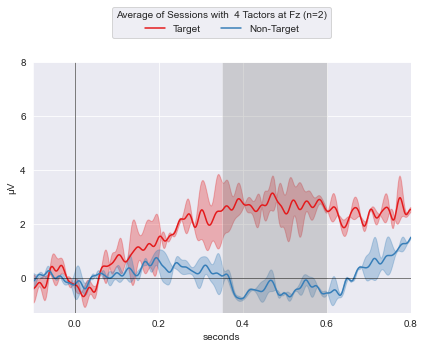

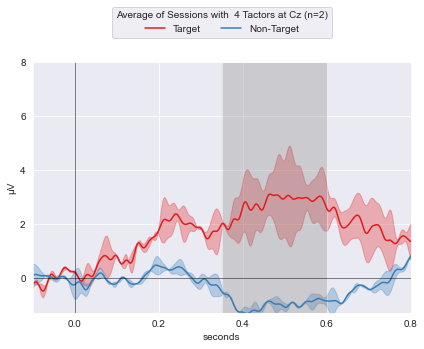

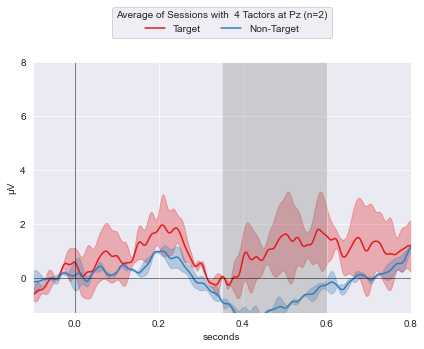

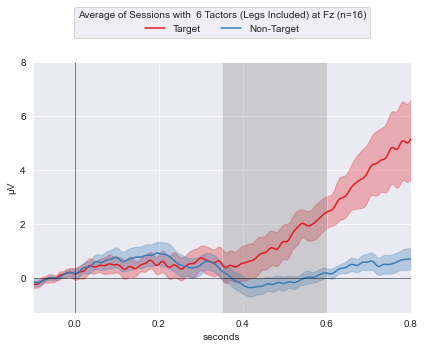

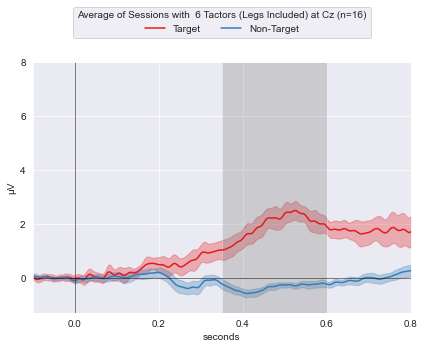

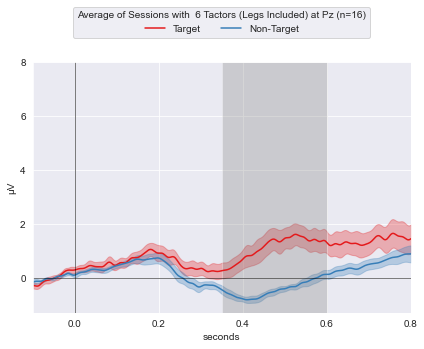

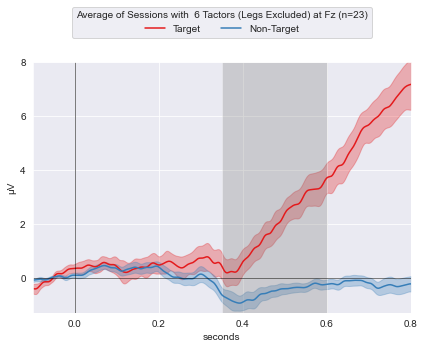

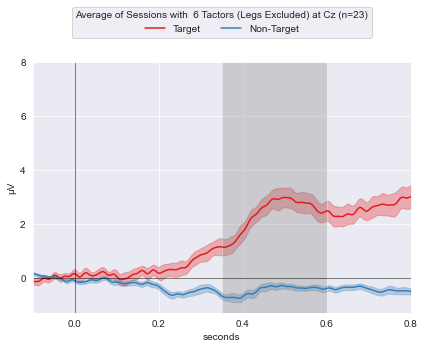

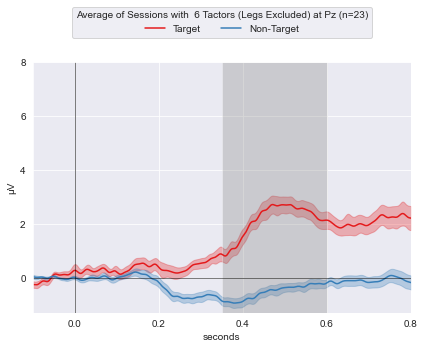

In [8]:
sections = ["4_tactors","6_tactors_legs_included","6_tactors_legs_excluded"]
titles = ["4 Tactors", r"6 Tactors (Legs Included)", r"6 Tactors (Legs Excluded)"]
for i,file_extension in enumerate(sections):
    with open(r"created_data_LIS\average_amplitudes_" + file_extension +".pickle","rb") as file:
           amp_array = pickle.load(file)
    timestamps = np.genfromtxt(r"created_data_LIS/epoch_timetstamps_" + file_extension +".csv", delimiter=',')
    electrodes_to_plot =["Fz","Cz","Pz"] # ["Fz","Fc1","Fc2","C3","Cz","C4","Pz"]
    y_lim = (-1.3,8)
    plot_amplitude(amp_array,timestamps,electrodes_to_plot,titles[i],y_lim)

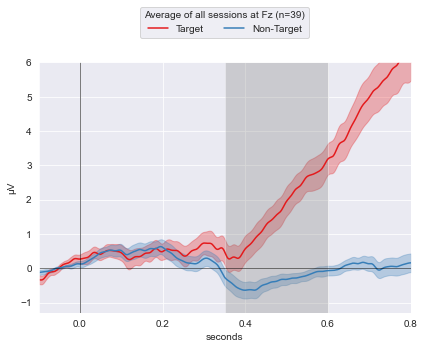

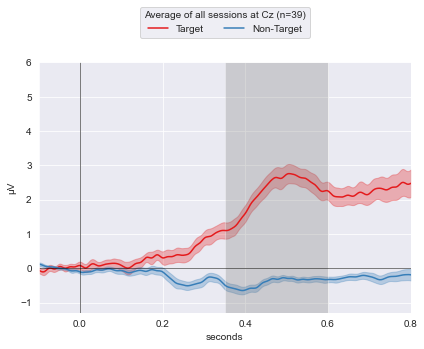

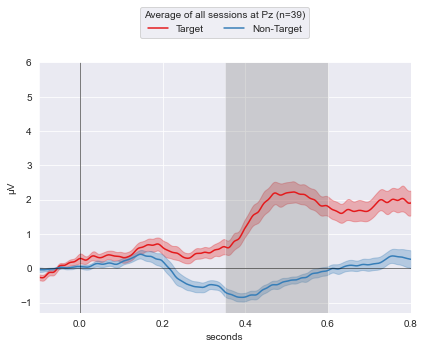

In [14]:
sections = ["6_tactors_all"]
titles = [""]
for i,file_extension in enumerate(sections):
    with open(r"created_data_LIS\average_amplitudes_" + file_extension +".pickle","rb") as file:
           amp_array = pickle.load(file)
    timestamps = np.genfromtxt(r"created_data_LIS/epoch_timetstamps_" + file_extension +".csv", delimiter=',')
    electrodes_to_plot =["Fz","Cz","Pz"] # ["Fz","Fc1","Fc2","C3","Cz","C4","Pz"]
    y_lim = (-1.3,6)
    plot_amplitude(amp_array,timestamps,electrodes_to_plot,titles[i],y_lim)

# 4. Plot amplitudes over time (sessionwise)

In [ ]:
tac4 = pd.read_csv(r"created_data_LIS\average_amplitudes_350_600_4_tactors.csv")
tac6_inlegs = pd.read_csv(r"created_data_LIS\average_amplitudes_350_600_6_tactors_legs_included.csv")
tac6_exlegs = pd.read_csv(r"created_data_LIS\average_amplitudes_350_600_6_tactors_legs_excluded.csv")
tac6_inlegs.Session = tac6_inlegs.Session +100 # add arbitray number to have unique session names
tac6_exlegs.Session = tac6_exlegs.Session +100
all_amp =pd.concat([tac4,tac6_inlegs,tac6_exlegs])

ascending_session_names = dict(zip(all_amp.Session.unique(),range(1,all_amp.Session.unique().size+1)))
all_amp.Session = all_amp["Session"].map(ascending_session_names)
all_amp.groupby(["Session","Condition"]).mean().to_csv(r"created_data_LIS\average_amplitudes_350_600_all.csv")

In [ ]:
tac4 = all_amp.loc[all_amp.Session <31]
tac6_legs = all_amp.loc[(all_amp.Session >=31) &(all_amp.Session <57)]
tac6_no_legs = all_amp.loc[all_amp.Session >=57]
title= ["4 Tactors", "6 Tactors with legs", "6 Tactors without legs"]
x_lim=[(0,31),(30,61),(55,81)]

for i,data_set in enumerate([tac4,tac6_legs, tac6_no_legs]):
    tar_df = data_set.loc[(data_set.Condition == "Target") & (data_set.Electrode == "Cz")].groupby("Session").mean().reset_index(level=[0,0])
    ntar_df = data_set.loc[(data_set.Condition == "nonTarget")& (data_set.Electrode == "Cz")].groupby("Session").mean().reset_index(level=[0,0])

    fig, ax = plt.subplots(figsize = (12,5))
    if i==1:
        ax.axvline(x=42,alpha=0.65,zorder=0,c="k",ls="--",lw=1.3,label ="Electrode SetB" ) # electrode set b    
        ax.axvspan(30.5, 47.5, facecolor="#808080", alpha=0.3,label = "High Intensity Training")
    tar = ax.bar(tar_df["Session"],tar_df["Mean Amplitude"],color = col_list[1], width=0.2,alpha=0.65 ,label = "Target")
    ntar = ax.bar(ntar_df["Session"],ntar_df["Mean Amplitude"],color = col_list[0], width=0.2,alpha=0.65,label = "NonTarget")
    
    lgd =ax.legend(ncol=5, title="Amplitudes "+ title[i],loc='center', bbox_to_anchor=(0.5, 1.13),fontsize='small', fancybox=True)
    ax.axhline(y=0,c='k',lw=0.5)
    ax.set_ylabel("µV")
    ax.set_xlim(x_lim[i])
    ax.set_ylim((-1.5,4.5))

    fig.tight_layout
    plt.savefig(r"created_data_LIS\Timeline_" + title[i]+ ".svg",bbox_inches="tight",pad_inches=0.2,format="svg")

# 5. plot single session ERPs

C:\Users\User01\anaconda3\envs\p300\lib\site-packages\ipykernel_launcher.py:36: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


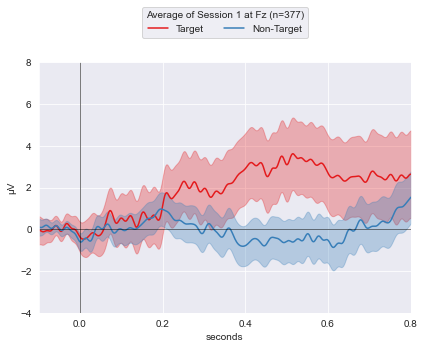

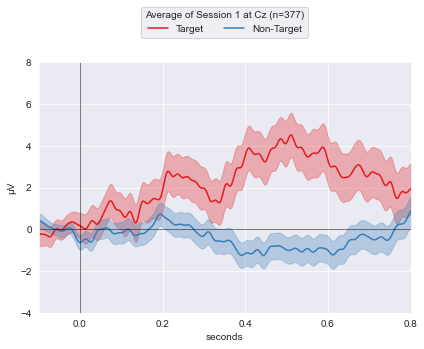

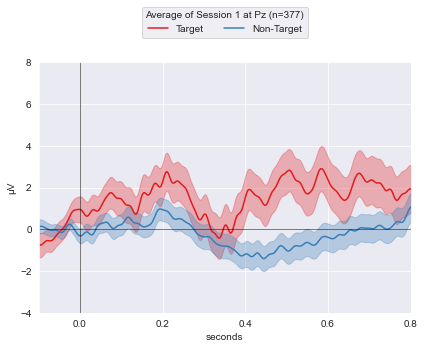

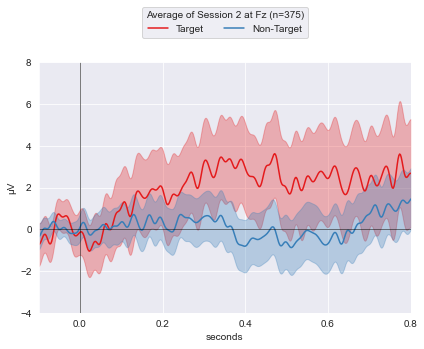

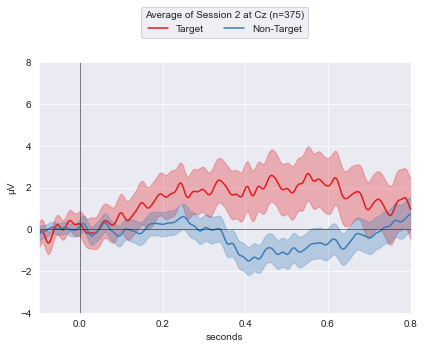

...

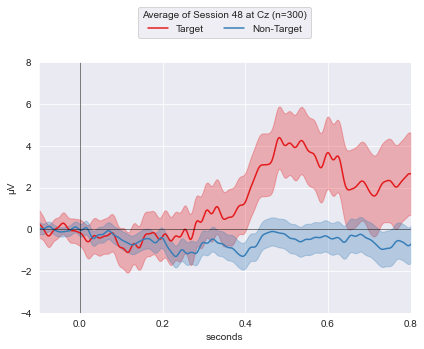

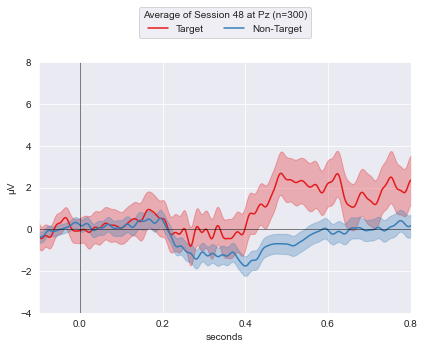

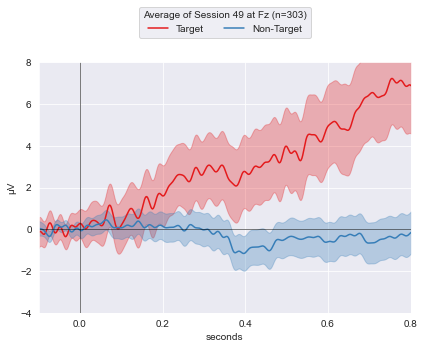

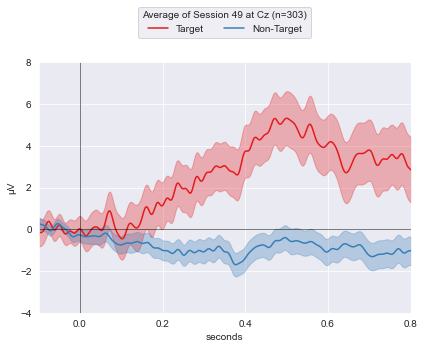

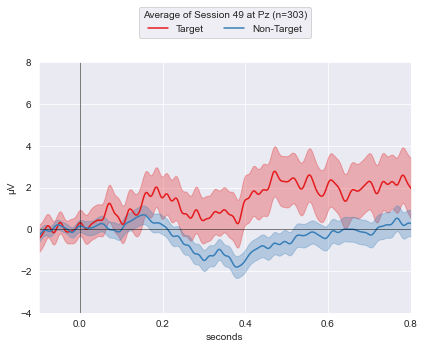

In [12]:
#4 tactors
sess_list = range(1,31)
data_origin = r"G:\Meine Ablage\PhD\P300\LIS_Paper\Data\mne_raw_4tac"
prefix_calib = r"\4tac_Calib_S"
prefix_copy = r"\4tac_Copy_S"
file_extension = "4_tactors"

plot_amplitude_sessionwise(sess_list, data_origin,prefix_calib,prefix_copy,file_extension, picks= ["Fz","Cz","Pz"])

#6 tactors - legs included
excluded_sessions = [4,7,10,11,12,16,18,19,20,32] #some sessions were training session which followed after the standard protocol (they happend on the same day and are excluded from analysis)
sess_list = [i for i in range(1,50) if i not in excluded_sessions]
data_origin = r"G:\Meine Ablage\PhD\P300\LIS_Paper\Data\mne_raw_6tac"
prefix_calib = r"\Calib_S"
prefix_copy = r"\Free_S"
file_extension = "6_tactors"

plot_amplitude_sessionwise(sess_list, data_origin,prefix_calib,prefix_copy,file_extension, picks= ["Fz","Cz","Pz"])

# 6. Plot single session R²

In [ ]:
#4 tactors
sess_list = range(1,31)
data_origin = r"G:\Meine Ablage\PhD\P300\LIS_Paper\Data\mne_raw_4tac"
prefix_calib = r"\4tac_Calib_S"
prefix_copy = r"\4tac_Copy_S"
file_extension = "4_tactors"

plot_r2(sess_list, data_origin,prefix_calib,prefix_copy,file_extension)

#6 tactors - legs included
excluded_sessions = [4,7,10,11,12,16,18,19,20,32] #some sessions were training session which followed after the standard protocol (they happend on the same day and are excluded from analysis)
sess_list = [i for i in range(1,50) if i not in excluded_sessions]
data_origin = r"G:\Meine Ablage\PhD\P300\LIS_Paper\Data\mne_raw_6tac"
prefix_calib = r"\Calib_S"
prefix_copy = r"\Free_S"
file_extension = "6_tactors"

plot_r2(sess_list, data_origin,prefix_calib,prefix_copy,file_extension)